LINKS:
  -COLAB: https://colab.research.google.com/drive/1VdOXhUN7HgQAPp9e1hqFdwMhTEwhzHN_#scrollTo=mhQgHtA7vMjf

  -DRIVE:https://colab.research.google.com/drive/1s2aOC15BR2ZAzb-RZQjlSWBRtJyU0IaN?usp=drive_link

# part 1

## Getting data

In [109]:
import pandas as pd

file_id = '117LO2wPC6D-Dr2LfkIVZfZDWrVMoEIGR'
url = f'https://drive.google.com/uc?export=download&id={file_id}'
df = pd.read_csv(url)

### get familiar with data

In [110]:
print(df.head())

   age     sex     bmi  children smoker     region      charges
0   19  female  27.900         0    yes  southwest  16884.92400
1   18    male  33.770         1     no  southeast   1725.55230
2   28    male  33.000         3     no  southeast   4449.46200
3   33    male  22.705         0     no  northwest  21984.47061
4   32    male  28.880         0     no  northwest   3866.85520


our data contains info about age, sex, bmi, region, charges, and whether or not if the user is a smoker

In [111]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB
None


no attribiute is null that means we don't have to deal with missing value:)

there ae 1338 users which is quiet small data set


In [112]:
print(df.describe())

               age          bmi     children       charges
count  1338.000000  1338.000000  1338.000000   1338.000000
mean     39.207025    30.663397     1.094918  13270.422265
std      14.049960     6.098187     1.205493  12110.011237
min      18.000000    15.960000     0.000000   1121.873900
25%      27.000000    26.296250     0.000000   4740.287150
50%      39.000000    30.400000     1.000000   9382.033000
75%      51.000000    34.693750     2.000000  16639.912515
max      64.000000    53.130000     5.000000  63770.428010


range of data for numerical values are different, therefore, we propably need to normalize the data

In [113]:
print(df.nunique())

age           47
sex            2
bmi          548
children       6
smoker         2
region         4
charges     1337
dtype: int64


we can probably turn sex, smoker, and region to other attribiutes using one-hot and binary encoders.

In [114]:
print(df['sex'].value_counts())
print(df['smoker'].value_counts())
print(df['region'].value_counts())
print(df['children'].value_counts())

sex
male      676
female    662
Name: count, dtype: int64
smoker
no     1064
yes     274
Name: count, dtype: int64
region
southeast    364
southwest    325
northwest    325
northeast    324
Name: count, dtype: int64
children
0    574
1    324
2    240
3    157
4     25
5     18
Name: count, dtype: int64


sex and region have approximatly similar count but smoker doesnt have which may cause problem. we should deal with this with different methods like stratifing when doing the split to ensure ratio of smokers and non smokers is the same in train and test

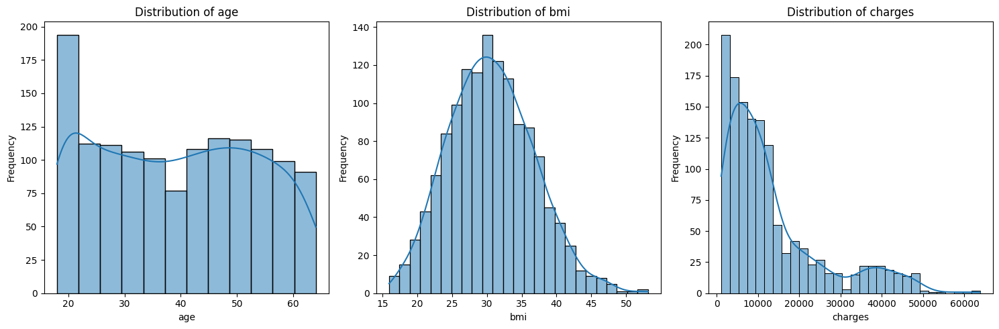

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns

numerical_cols = ['age', 'bmi', 'charges']

plt.figure(figsize=(15, 5))

for i, col in enumerate(numerical_cols):
    plt.subplot(1, 3, i + 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

bmi is normal but charges and age are not

In [116]:
df = df.drop_duplicates()

print(f"DataFrame shape: {df.shape}")

DataFrame shape: (1337, 7)


delete repeated users

## Train-test split

There are two competing concerns: with less training data, your parameter estimates have greater variance. With less testing data, your performance statistic will have greater variance. Broadly speaking you should be concerned with dividing data such that neither variance is too high, which is more to do with the absolute number of instances in each category rather than the percentage.

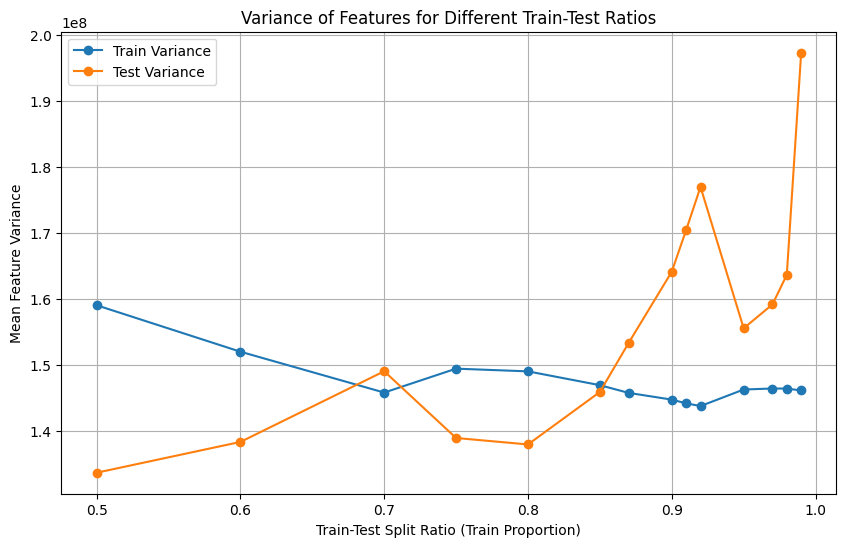

The best train-test split ratio based on variance is 0.8


In [117]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

X = df[['charges']]

split_ratios = [0.5, 0.6, 0.7,.75, 0.8,0.85,0.87, 0.9,0.91,0.92,0.95,0.97,0.98,0.99]
train_variances = []
test_variances = []

for ratio in split_ratios:
    X_train, X_test = train_test_split(X, test_size=1-ratio, random_state=33)
    train_variance = X_train.var().mean()  # Mean of variances across features
    test_variance = X_test.var().mean()

    train_variances.append(train_variance)
    test_variances.append(test_variance)

# Find the best ratio
variance_differences = np.abs(np.array(train_variances) + np.array(test_variances))
best_ratio_index = np.argmin(variance_differences)
best_ratio = split_ratios[best_ratio_index]

# Plot the variances
plt.figure(figsize=(10, 6))
plt.plot(split_ratios, train_variances, marker='o', label='Train Variance')
plt.plot(split_ratios, test_variances, marker='o', label='Test Variance')
plt.title('Variance of Features for Different Train-Test Ratios')
plt.xlabel('Train-Test Split Ratio (Train Proportion)')
plt.ylabel('Mean Feature Variance')
plt.legend()
plt.grid()
plt.show()

# Print the best ratio
print(f"The best train-test split ratio based on variance is {best_ratio:.1f}")


In [118]:
X = df.drop('charges', axis=1)
y = df['charges']
s = df['smoker']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33, stratify=s)

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (1069, 6)
X_test shape: (268, 6)
y_train shape: (1069,)
y_test shape: (268,)


Separating the features from the target variable.

Dividing the data into training and testing sets for model evaluation.

Ensuring a representative distribution of the smoker feature in both sets.

### based on model

Best Test Size Ratio: 0.75
Best MSE: 35673618.281428345
Corresponding RMSE: 5972.739595983433
Corresponding MAE: 4136.937677397288


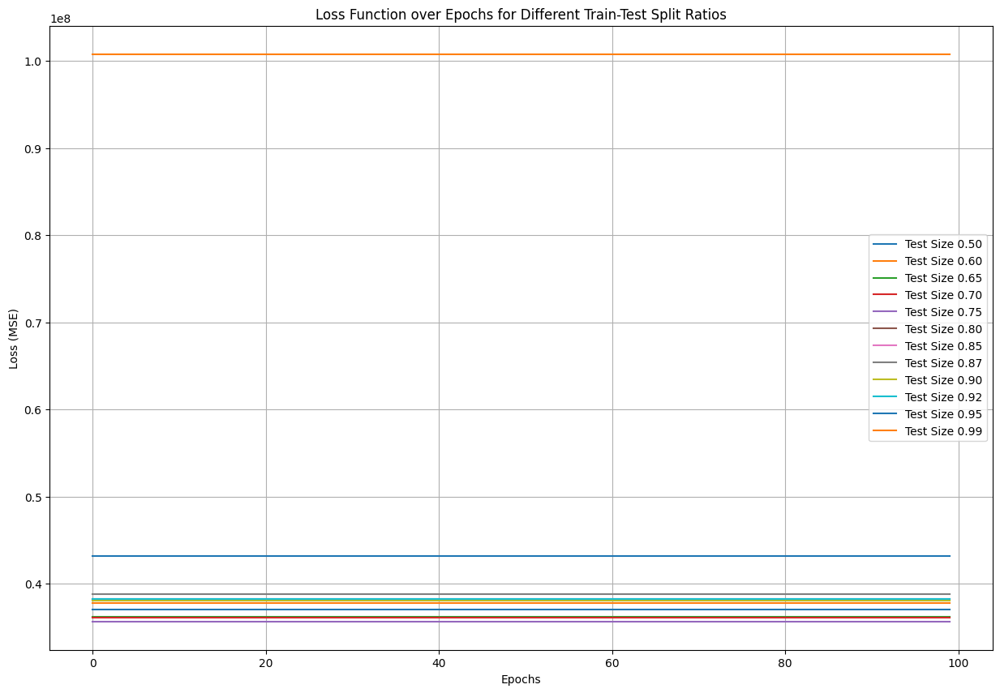

In [133]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split



# Encode categorical variables
label_encoder = LabelEncoder()
for column in X.select_dtypes(include=['object', 'category']).columns:
    X[column] = label_encoder.fit_transform(X[column])

# Normalize numerical variables
scaler = StandardScaler()
X[X.select_dtypes(include=[np.number]).columns] = scaler.fit_transform(X[X.select_dtypes(include=[np.number]).columns])

# Function to train the model and track the loss over epochs
def train_and_track_loss(X_train, y_train, X_test, y_test):
    model = LinearRegression()
    loss_history = []

    # Simulating epochs (Linear Regression converges in one step, but we'll loop for demonstration)
    for epoch in range(100):
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        loss_history.append(mse)

    return loss_history

# Test different train-test split ratios
split_ratios = [0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.87, 0.9, 0.92, 0.95, 0.99]
loss_histories = []
metrics = {'MSE': [], 'RMSE': [], 'MAE': []}

for ratio in split_ratios:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=ratio, random_state=33)

    # Train the model and track the loss
    loss_history = train_and_track_loss(X_train, y_train, X_test, y_test)
    loss_histories.append((ratio, loss_history))

    # Calculate final metrics
    final_mse = loss_history[-1]
    y_pred = LinearRegression().fit(X_train, y_train).predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    metrics['MSE'].append(final_mse)
    metrics['RMSE'].append(rmse)
    metrics['MAE'].append(mae)

# Find the best split ratio based on the lowest MSE
best_index = np.argmin(metrics['MSE'])
best_ratio = split_ratios[best_index]
best_mse = metrics['MSE'][best_index]
best_rmse = metrics['RMSE'][best_index]
best_mae = metrics['MAE'][best_index]

print(f'Best Test Size Ratio: {best_ratio}')
print(f'Best MSE: {best_mse}')
print(f'Corresponding RMSE: {best_rmse}')
print(f'Corresponding MAE: {best_mae}')

# Plotting the loss functions for each train-test split ratio
plt.figure(figsize=(15, 10))

for ratio, loss_history in loss_histories:
    plt.plot(loss_history, label=f'Test Size {ratio:.2f}')

plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Loss Function over Epochs for Different Train-Test Split Ratios')
plt.legend()
plt.grid(True)
plt.show()


In [134]:
X = df.drop('charges', axis=1)
y = df['charges']
s = df['smoker']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=33, stratify=s)

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (1002, 6)
X_test shape: (335, 6)
y_train shape: (1002,)
y_test shape: (335,)


## preprocessing

In [135]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoder.fit(X_train[['region']])

encoded_region_train = encoder.transform(X_train[['region']])
encoded_region_test = encoder.transform(X_test[['region']])

# Create new column names for the one-hot encoded features
encoded_region_columns = encoder.get_feature_names_out(['region'])

# Convert the encoded features to DataFrames
encoded_region_train_df = pd.DataFrame(encoded_region_train, columns=encoded_region_columns, index=X_train.index)
encoded_region_test_df = pd.DataFrame(encoded_region_test, columns=encoded_region_columns, index=X_test.index)

# Concatenate the encoded features with the original training and testing DataFrames
X_train = pd.concat([X_train.drop('region', axis=1), encoded_region_train_df], axis=1)
X_test = pd.concat([X_test.drop('region', axis=1), encoded_region_test_df], axis=1)

In [136]:
print(X_train.T)
print(X_test.T)

                    986     1258    220     290     392     1050    58    \
age                   43      55      34      28      48      44      53   
sex                 male    male  female  female    male  female  female   
bmi               30.115  37.715    33.7    33.4  31.445  36.955   22.88   
children               3       3       1       0       1       1       1   
smoker                no      no      no      no      no      no     yes   
region_northeast     0.0     0.0     0.0     0.0     1.0     0.0     0.0   
region_northwest     1.0     1.0     0.0     0.0     0.0     1.0     0.0   
region_southeast     0.0     0.0     0.0     0.0     0.0     0.0     1.0   
region_southwest     0.0     0.0     1.0     1.0     0.0     0.0     0.0   

                    1210    528     447   ...   315     509    1327   738   \
age                   36      46      56  ...     52      57     51     23   
sex                 male    male  female  ...   male  female   male   male   
bmi  

apply one-hot encoding for region because it is a categorial attribiute

In [137]:

encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoder.fit(X_train[['children']])

encoded_children_train = encoder.transform(X_train[['children']])
encoded_children_test = encoder.transform(X_test[['children']])

encoded_children_columns = encoder.get_feature_names_out(['children'])

encoded_children_train_df = pd.DataFrame(encoded_children_train, columns=encoded_children_columns, index=X_train.index)
encoded_children_test_df = pd.DataFrame(encoded_children_test, columns=encoded_children_columns, index=X_test.index)

X_train = pd.concat([X_train.drop('children', axis=1), encoded_children_train_df], axis=1)
X_test = pd.concat([X_test.drop('children', axis=1), encoded_children_test_df], axis=1)

print(X_train.T)
X_test.T

                    986     1258    220     290     392     1050    58    \
age                   43      55      34      28      48      44      53   
sex                 male    male  female  female    male  female  female   
bmi               30.115  37.715    33.7    33.4  31.445  36.955   22.88   
smoker                no      no      no      no      no      no     yes   
region_northeast     0.0     0.0     0.0     0.0     1.0     0.0     0.0   
region_northwest     1.0     1.0     0.0     0.0     0.0     1.0     0.0   
region_southeast     0.0     0.0     0.0     0.0     0.0     0.0     1.0   
region_southwest     0.0     0.0     1.0     1.0     0.0     0.0     0.0   
children_0           0.0     0.0     0.0     1.0     0.0     0.0     0.0   
children_1           0.0     0.0     1.0     0.0     1.0     1.0     1.0   
children_2           0.0     0.0     0.0     0.0     0.0     0.0     0.0   
children_3           1.0     1.0     0.0     0.0     0.0     0.0     0.0   
children_4  

,574,1312,175,1228,891,112,330,1141,31,150,...,320,1159,570,16,261,476,960,83,218,308
age,57,34,63,56,36,37,61,41,18,35,...,34,32,31,52,20,24,19,48,26,58
sex,female,male,female,male,female,male,female,female,female,male,...,male,female,female,female,female,male,female,female,female,male
bmi,34.295,42.9,37.7,34.43,29.04,30.8,36.385,32.6,26.315,24.13,...,25.27,41.1,29.1,30.78,26.84,28.5,39.615,41.23,29.92,34.865
smoker,no,no,yes,no,no,no,yes,no,no,no,...,no,no,no,no,yes,yes,no,no,no,no
region_northeast,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
region_northwest,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
region_southeast,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
region_southwest,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
children_0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
children_1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0


apply one-hot encoding for children because it is a categorial attribiute

In [138]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

X_train['sex'] = label_encoder.fit_transform(X_train['sex'])
X_test['sex'] = label_encoder.transform(X_test['sex'])

X_train['smoker'] = label_encoder.fit_transform(X_train['smoker'])
X_test['smoker'] = label_encoder.transform(X_test['smoker'])

print(X_train.T)
print(X_test.T)

                    986     1258  220   290     392     1050   58      1210  \
age               43.000  55.000  34.0  28.0  48.000  44.000  53.00  36.000   
sex                1.000   1.000   0.0   0.0   1.000   0.000   0.00   1.000   
bmi               30.115  37.715  33.7  33.4  31.445  36.955  22.88  30.875   
smoker             0.000   0.000   0.0   0.0   0.000   0.000   1.00   0.000   
region_northeast   0.000   0.000   0.0   0.0   1.000   0.000   0.00   0.000   
region_northwest   1.000   1.000   0.0   0.0   0.000   1.000   0.00   1.000   
region_southeast   0.000   0.000   0.0   0.0   0.000   0.000   1.00   0.000   
region_southwest   0.000   0.000   1.0   1.0   0.000   0.000   0.00   0.000   
children_0         0.000   0.000   0.0   1.0   0.000   0.000   0.00   0.000   
children_1         0.000   0.000   1.0   0.0   1.000   1.000   1.00   1.000   
children_2         0.000   0.000   0.0   0.0   0.000   0.000   0.00   0.000   
children_3         1.000   1.000   0.0   0.0   0.000

apply binary encoding for sex(0: female, 1: male) and smoker(0: no, 1: yes)

In [139]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder


bins = [0, 25, 35, 45, 60, 100]
labels = ['0-25', '26-35', '36-45', '46-60', '61+']

# Apply binning to age
X_train['age_group'] = pd.cut(X_train['age'], bins=bins, labels=labels, right=True)
X_test['age_group'] = pd.cut(X_test['age'], bins=bins, labels=labels, right=True)

# One-hot encode the age groups
encoder = OneHotEncoder(sparse_output=False, drop='first')  # Drop first to avoid multicollinearity
age_train_encoded = encoder.fit_transform(X_train[['age_group']])
age_test_encoded = encoder.transform(X_test[['age_group']])

# Convert encoded data to DataFrame
age_train_df = pd.DataFrame(age_train_encoded, columns=encoder.get_feature_names_out(['age_group']))
age_test_df = pd.DataFrame(age_test_encoded, columns=encoder.get_feature_names_out(['age_group']))

# Concatenate the one-hot encoded columns back to the original datasets
X_train = pd.concat([X_train.reset_index(drop=True), age_train_df], axis=1).drop(columns=['age_group'])
X_test = pd.concat([X_test.reset_index(drop=True), age_test_df], axis=1).drop(columns=['age_group'])

# Print results
print("Transformed Training Data:")
print(X_train)

print("\nTransformed Testing Data:")
print(X_test)


Transformed Training Data:
      age  sex     bmi  smoker  region_northeast  region_northwest  \
0      43    1  30.115       0               0.0               1.0   
1      55    1  37.715       0               0.0               1.0   
2      34    0  33.700       0               0.0               0.0   
3      28    0  33.400       0               0.0               0.0   
4      48    1  31.445       0               1.0               0.0   
...   ...  ...     ...     ...               ...               ...   
997    59    1  28.785       0               0.0               1.0   
998    26    1  30.000       0               0.0               0.0   
999    21    0  34.600       0               0.0               0.0   
1000   24    1  40.150       1               0.0               0.0   
1001   50    1  32.300       1               1.0               0.0   

      region_southeast  region_southwest  children_0  children_1  children_2  \
0                  0.0               0.0         0.0

In [140]:
X_test.drop('age', axis=1, inplace=True)
X_train.drop('age', axis=1, inplace=True)

apply bins to age and then one-hot encoding

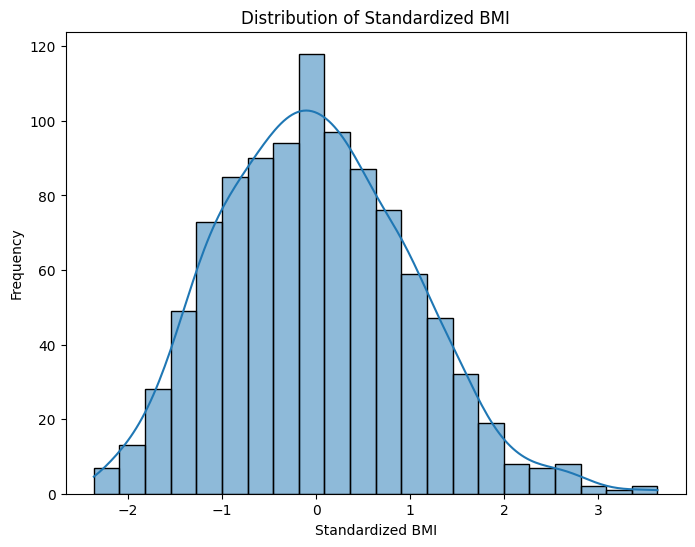

In [141]:
from sklearn.preprocessing import StandardScaler # Import StandardScaler

numerical_cols = ['bmi']

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the numerical features in the training set
X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])

# Transform the numerical features in the test set using the same scaler
X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])
plt.figure(figsize=(8, 6))
sns.histplot(X_train['bmi'], kde=True)
plt.title('Distribution of Standardized BMI')
plt.xlabel('Standardized BMI')
plt.ylabel('Frequency')
plt.show()

applying standardization for bmi because bmi distribiution is near normal

## saving test and train data in csv files

In [142]:

from sklearn.preprocessing import StandardScaler

X_train.to_csv('X_train.csv', index=False)
y_train.to_csv('y_train.csv', index=False)

# Save the testing data to a CSV file
X_test.to_csv('X_test.csv', index=False)
y_test.to_csv('y_test.csv', index=False)

In [156]:
import pandas as pd
# Load the preprocessed data from CSV files
X_train = pd.read_csv('X_train.csv')
y_train = pd.read_csv('y_train.csv')
X_test = pd.read_csv('X_test.csv')
y_test = pd.read_csv('y_test.csv')

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (1002, 17)
X_test shape: (335, 17)
y_train shape: (1002, 1)
y_test shape: (335, 1)


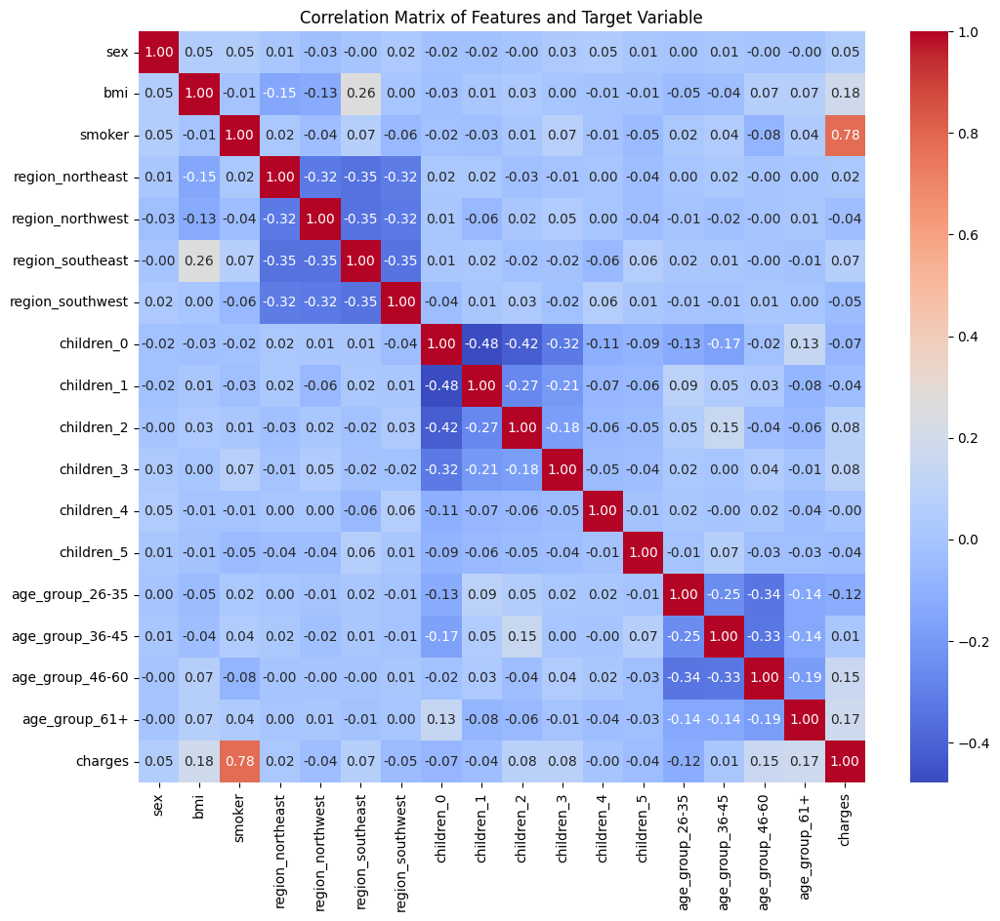

In [144]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Combine X_train and y_train for correlation analysis
combined_df = pd.concat([X_train, y_train], axis=1)

# Calculate the correlation matrix
correlation_matrix = combined_df.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Features and Target Variable')
plt.show()

# part 2

## training the model

In [145]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

print("Model training complete.")


Model training complete.


## Evaluate


<div style="text-align: right;", dir="rtl">

1. Mean Squared Error (MSE)
خطای میانگین مربعات، میانگین مربع اختلافات بین مقادیر واقعی (
𝑦
true
y
true
​
 ) و پیش‌بینی‌شده (
𝑦
pred
y
pred
​
 ) است:



ویژگی‌ها:
مقادیر بزرگ‌تر از اختلاف‌ها به شدت بیشتر تأثیر می‌گذارند، زیرا مربعات اختلاف محاسبه می‌شوند.
واحد آن برابر با مربع واحد متغیر هدف است (مثلاً اگر متغیر هدف قیمت باشد و بر حسب دلار باشد، واحد MSE دلار مربع است).


مزایا:

حساسیت به خطاهای بزرگ، که به کاهش این نوع خطاها کمک می‌کند.


معایب:

به دلیل مربع شدن، واحد آن با متغیر هدف متفاوت است و تفسیر آن دشوارتر است.
2. Root Mean Squared Error (RMSE)
جذر خطای میانگین مربعات، جذر MSE است


ویژگی‌ها:
برخلاف MSE، واحد RMSE همان واحد متغیر هدف است (مثلاً دلار)، که تفسیر آن را آسان‌تر می‌کند.
همچنان نسبت به خطاهای بزرگ حساس است.

مزایا:

به دلیل واحد قابل‌فهم (همان واحد متغیر هدف)، RMSE اغلب برای ارائه نتایج استفاده می‌شود.

معایب:

همچنان به خطاهای بزرگ بیش از حد حساس است.
3. Mean Absolute Error (MAE)
خطای میانگین مطلق، میانگین قدر مطلق اختلافات بین مقادیر واقعی و پیش‌بینی‌شده است

ویژگی‌ها:
مقادیر اختلاف به صورت مطلق محاسبه می‌شوند، بنابراین MAE خطاهای بزرگ را بیش از حد بزرگ نمی‌کند.
واحد آن همان واحد متغیر هدف است.

مزایا:

به دلیل محاسبه ساده‌تر و عدم تأثیر زیاد خطاهای بزرگ، نسبت به داده‌های پراکنده پایدارتر است.

معایب:

حساسیت کمتری به خطاهای بزرگ دارد و در برخی موارد ممکن است مدل را برای کاهش همه نوع خطاها کمینه نکند.
</div>

In [146]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Make predictions
y_pred = model.predict(X_test)

# Evaluate performance
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

# Print results
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")


Mean Squared Error (MSE): 37416033.11
Root Mean Squared Error (RMSE): 6116.86
Mean Absolute Error (MAE): 4103.64


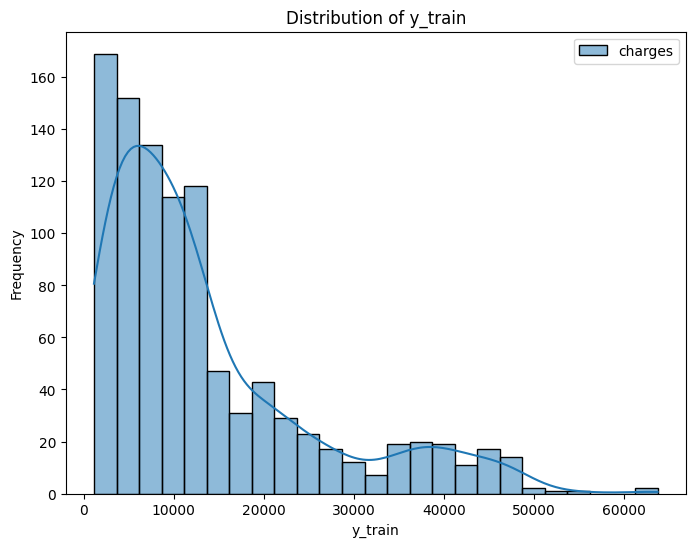

In [147]:

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.histplot(y_train, kde=True)
plt.title('Distribution of y_train')
plt.xlabel('y_train')
plt.ylabel('Frequency')
plt.show()

In [148]:

Q1 = y_train.quantile(0.25)
Q3 = y_train.quantile(0.75)
IQR = Q3 - Q1

# Define outlier boundaries
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Count outliers
outlier_count = ((y_train < lower_bound) | (y_train > upper_bound)).sum()

print(f"Number of outliers in y_train: {outlier_count}")

Number of outliers in y_train: charges    80
dtype: int64


Insurance charges often have outliers because of unique cases like smokers, age extremes, or unusually high medical bills.
If outliers matter (e.g., you're optimizing for higher accuracy in predicting expensive claims):
Use RMSE because it is interpretable and emphasizes reducing large errors.

If outliers don't matter as much (e.g., you're more concerned with overall accuracy):
Use MAE, as it is more robust to outliers.

Why RMSE Might Be More Suitable
Task Relevance: Insurance companies typically care about accurately predicting high-cost cases (e.g., for proper risk management). RMSE ensures that larger errors are penalized.

Interpretability: Since RMSE is in the same units as charges, stakeholders (e.g., actuaries, business analysts) can easily interpret it.
When MAE Might Be Better

If the dataset contains many outliers (e.g., a few extreme cases of very high charges), MAE would prevent these few outliers from skewing the performance metric.



<div style="text-align: right;", dir="rtl">

با توجه به شرايط مسيله چون تعداد outlier ها زياد نيست RMSE ميتواند بهتر باشد
</div>

# Part 3

## plotting regression line and each feature

SGDRegressor Initialization:

Initializes an SGDRegressor with max_iter=1, tol=None, and warm_start=True, enabling incremental learning by resetting only certain model states in each training iteration.

Incremental Training and Logging:

Trains the model iteratively for a specified number of epochs (epochs=100).
Every interval epochs (e.g., 20), it:
Evaluates predictions on both the training and test sets.
Computes the root mean squared error (RMSE) for both sets.
Logs the current regression model's intercept and coefficients for visualization.
Visualization of Regression Line

Evolution:

For each feature in the dataset, plots the scatter data (training in blue, testing in red) along with regression lines from earlier intervals as dotted lines and the current regression line as a solid line. These plots illustrate the evolution of the regression model over time.

RMSE vs. Epochs Plot:

After training is complete, it plots the RMSE values for both training and test datasets as a function of epochs, providing insight into the model's performance and generalization over iterations.

In [149]:
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (1002, 17)
X_test shape: (335, 17)
y_train shape: (1002, 1)
y_test shape: (335, 1)


In [150]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values.ravel()
y_test = y_test.values.ravel()

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


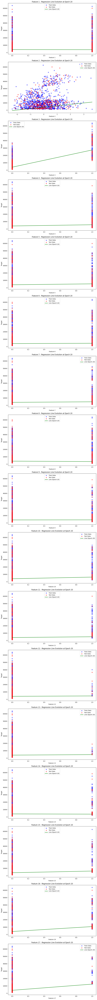

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


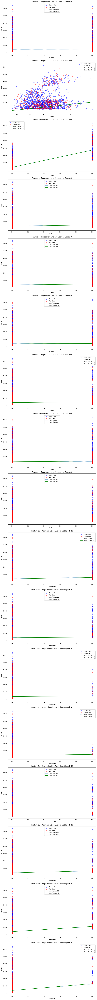

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


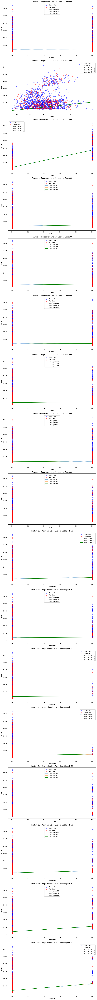

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


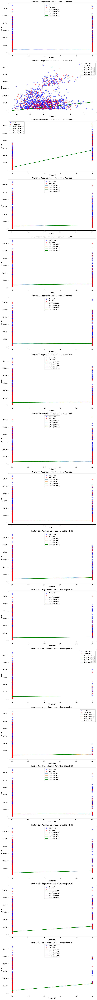

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


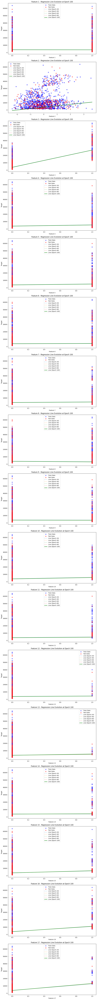

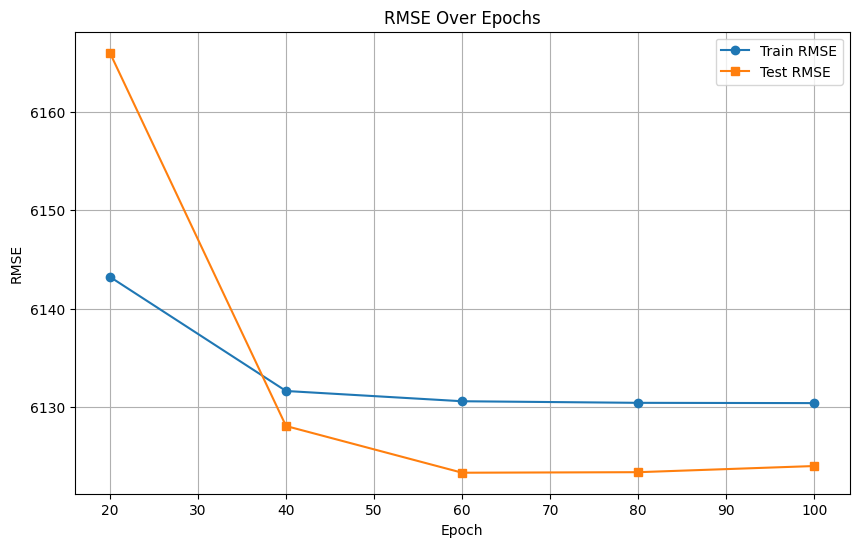

In [151]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error



# Initialize SGDRegressor
sgd = SGDRegressor(max_iter=1, tol=None, warm_start=True, random_state=42)

# Storage for RMSE values and regression coefficients
train_rmse = []
test_rmse = []
lines = []

# Training and storing results every 20 epochs
epochs = 100
interval = 20
n_features = X_train.shape[1]  # Total number of features

for epoch in range(1, epochs + 1):
    sgd.fit(X_train, y_train)  # Incremental training
    if epoch % interval == 0:
        # Predict on train and test data
        y_pred_train = sgd.predict(X_train)
        y_pred_test = sgd.predict(X_test)

        # Calculate RMSE for train and test sets
        train_rmse_epoch = mean_squared_error(y_train, y_pred_train, squared=False)
        test_rmse_epoch = mean_squared_error(y_test, y_pred_test, squared=False)

        # Store RMSE values and regression line coefficients
        train_rmse.append(train_rmse_epoch)
        test_rmse.append(test_rmse_epoch)
        lines.append((sgd.intercept_[0], sgd.coef_.copy()))

        # Plotting regression lines for all features
        fig, axes = plt.subplots(n_features, 1, figsize=(10, 6 * n_features))
        if n_features == 1:
            axes = [axes]  # Ensure axes is iterable if there's only one feature

        for feature_idx in range(n_features):
            ax = axes[feature_idx]

            # Scatter plot for the feature
            x_vals_train = X_train[:, feature_idx]
            x_vals_test = X_test[:, feature_idx]
            x_range = np.linspace(
                min(x_vals_train.min(), x_vals_test.min()),
                max(x_vals_train.max(), x_vals_test.max()),
                100,
            )
            ax.scatter(x_vals_train, y_train, color='blue', label='Train Data', alpha=0.5)
            ax.scatter(x_vals_test, y_test, color='red', label='Test Data', alpha=0.5)

            # Plot previous regression lines as dotted
            for j, (intercept, coef) in enumerate(lines[:-1]):
                y_line_prev = intercept + coef[feature_idx] * x_range
                ax.plot(x_range, y_line_prev, linestyle='--', alpha=0.5, label=f'Line (Epoch {interval * (j + 1)})')

            # Plot the current regression line as solid
            intercept, coef = lines[-1]
            y_line = intercept + coef[feature_idx] * x_range
            ax.plot(x_range, y_line, color='green', label=f'Line (Epoch {epoch})', linewidth=2)

            # Titles and labels
            ax.set_title(f"Feature {feature_idx + 1} - Regression Line Evolution at Epoch {epoch}")
            ax.set_xlabel(f"Feature {feature_idx + 1}")
            ax.set_ylabel("Target")
            ax.legend()

        plt.tight_layout()
        plt.show()

# Plot RMSE vs. Epochs
epochs_list = list(range(interval, epochs + 1, interval))
plt.figure(figsize=(10, 6))
plt.plot(epochs_list, train_rmse, label='Train RMSE', marker='o')
plt.plot(epochs_list, test_rmse, label='Test RMSE', marker='s')
plt.title("RMSE Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.legend()
plt.grid()
plt.show()


because we want to plot a line we have to choose a feature and plot only the related regression line.

here i chose feature 2 (because others are binary and cannot really be seen)
if we want to plot the predicted y according to actual y we do not get a line(because it has 17 features) althogh it is linear but it is rather a hyper plane.

## plotting the predicted y and actual y

1. Data Loading and Exploration:

The code begins by importing necessary libraries like pandas, matplotlib, and seaborn.
It loads a dataset from Google Drive using a provided file ID.
It explores the data using df.head(), df.info(), df.describe(), and df.nunique() to understand the data's structure, data types, and potential issues like missing values.
It also visualizes the distribution of numerical features ('age', 'bmi', 'charges') using histograms.
2. Data Preprocessing:

It handles duplicates using df.drop_duplicates().
It performs a train-test split using train_test_split from scikit-learn, stratifying by the 'smoker' column to ensure a balanced distribution.
It applies one-hot encoding to categorical features ('region', 'children') using OneHotEncoder.
It applies binary encoding to 'sex' and 'smoker' features using LabelEncoder.
It bins the 'age' feature and applies one-hot encoding to the bins.
It standardizes the 'bmi' feature using StandardScaler.
Finally, it saves the preprocessed data into separate CSV files for training and testing.
3. Model Training and Evaluation:

It trains a linear regression model using LinearRegression from scikit-learn.
It evaluates the model's performance using metrics like Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and Mean Absolute Error (MAE).
It discusses the choice between RMSE and MAE for this specific problem, considering the presence of outliers in insurance charges.
4. Regression Line Visualization:

It uses SGDRegressor with incremental learning to visualize the evolution of the regression line over epochs.
It plots scatter data and regression lines for each feature, showing how the model adapts over time.
It plots RMSE values for both training and test datasets as a function of epochs to track performance.
5. Additional Visualizations:

It includes code to plot the actual vs. predicted target values for the test data to demonstrate the linear model's output.
It also provides functionality to isolate and plot the regression line for a specific feature to highlight its relationship with the target variable.
In the last part it shows the evolution of features over epochs.

Parameters:
max_iter=1:

Sets the maximum number of iterations for each call to the .fit() method.
By setting it to 1, the model performs one epoch of training on the data during each .fit() call. This is useful for manual control of the number of epochs.

tol=None:

Disables the convergence criteria based on tolerance. The training will only stop after completing the number of iterations specified by max_iter.

warm_start=True:

Allows the model to retain the state (i.e., learned weights and coefficients) from the previous .fit() call. This enables incremental learning, where the model continues training from where it left off.

random_state=42:

Sets the random seed for reproducibility. This ensures the random elements of SGD (like data shuffling) produce the same results every time the code runs.

In [ ]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values.ravel()
y_test = y_test.values.ravel()

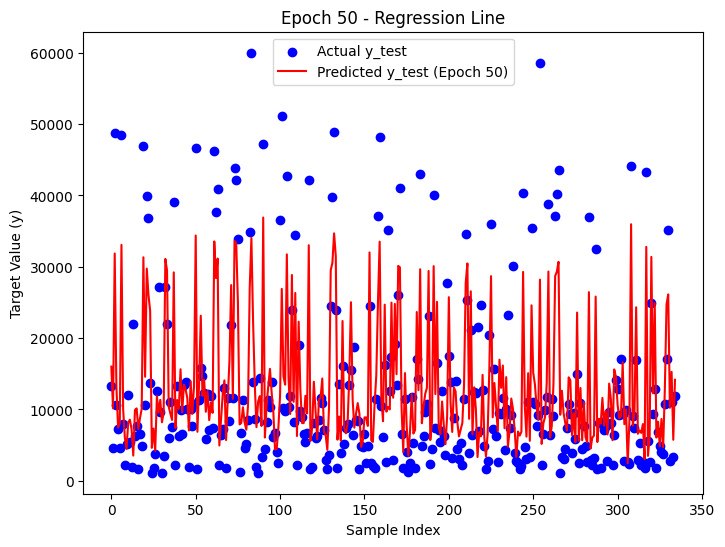

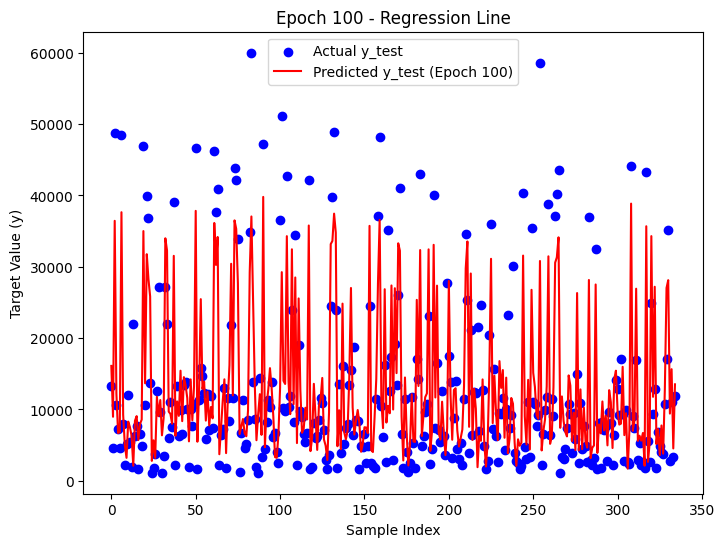

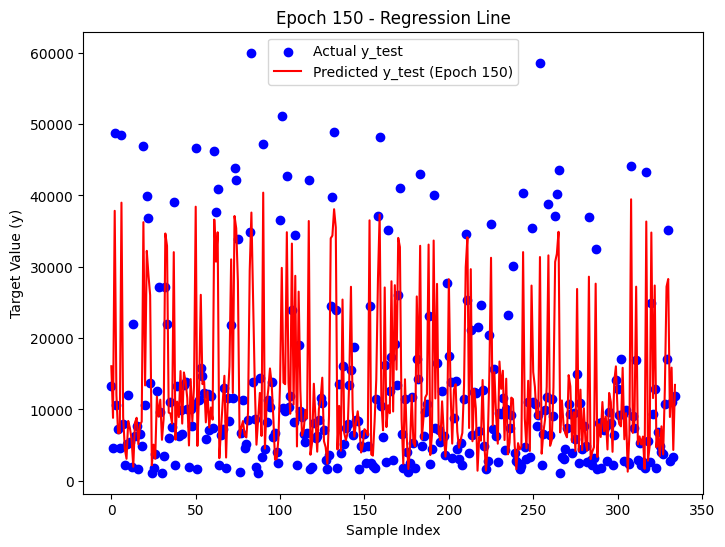

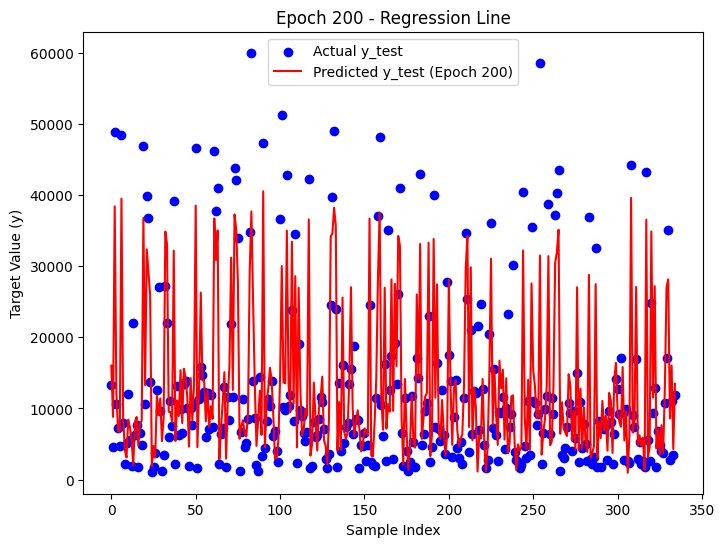

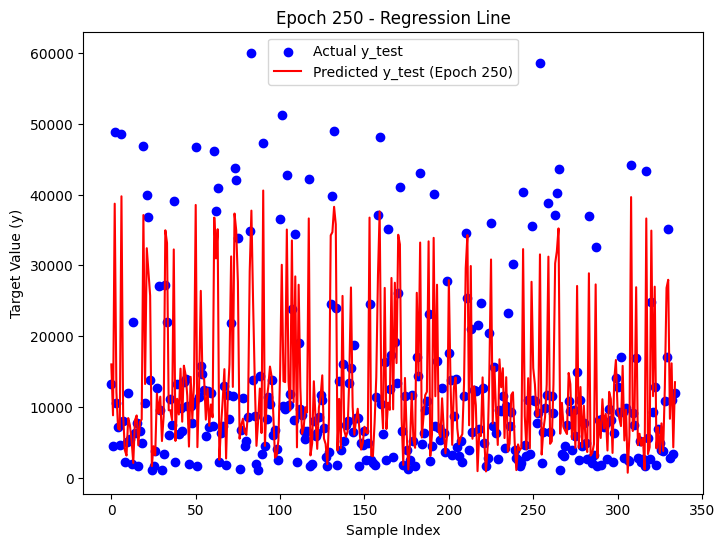

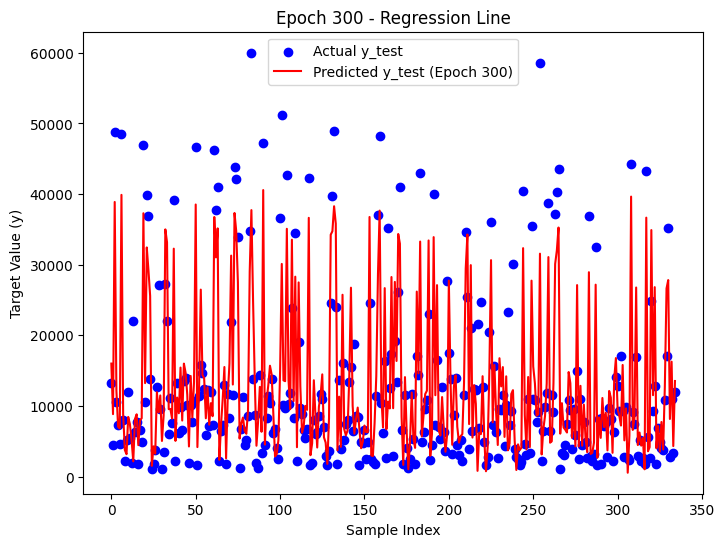

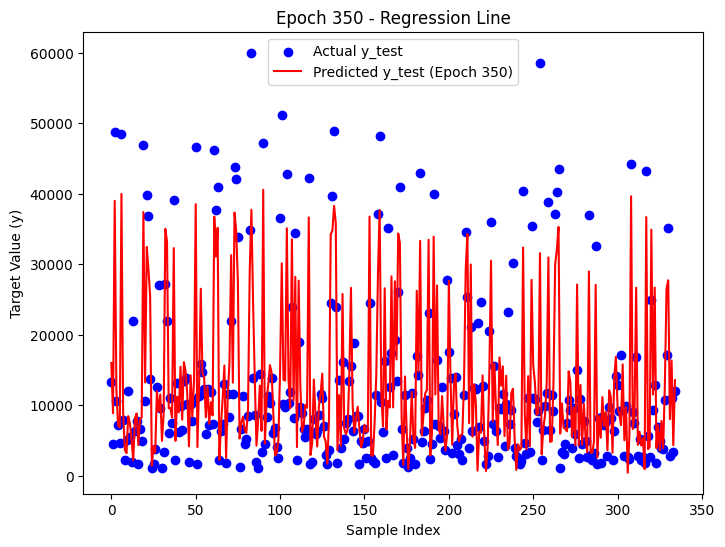

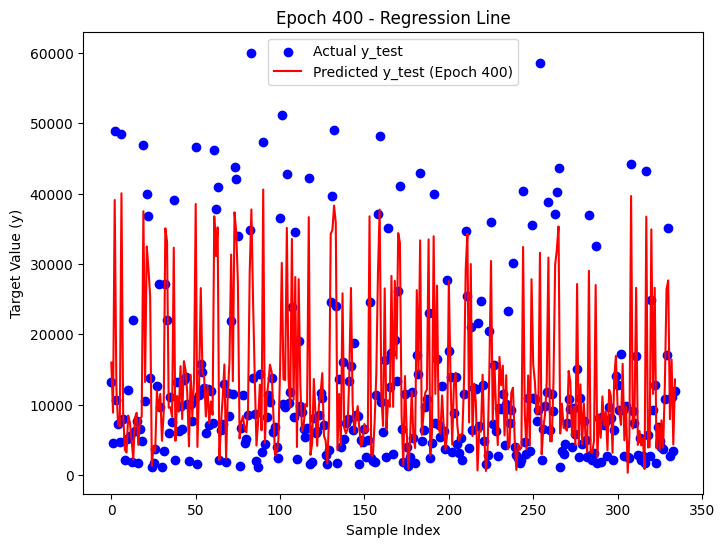

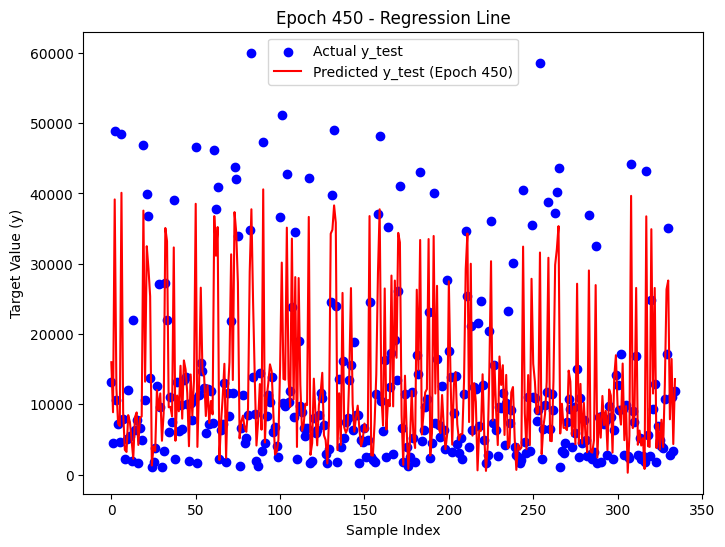

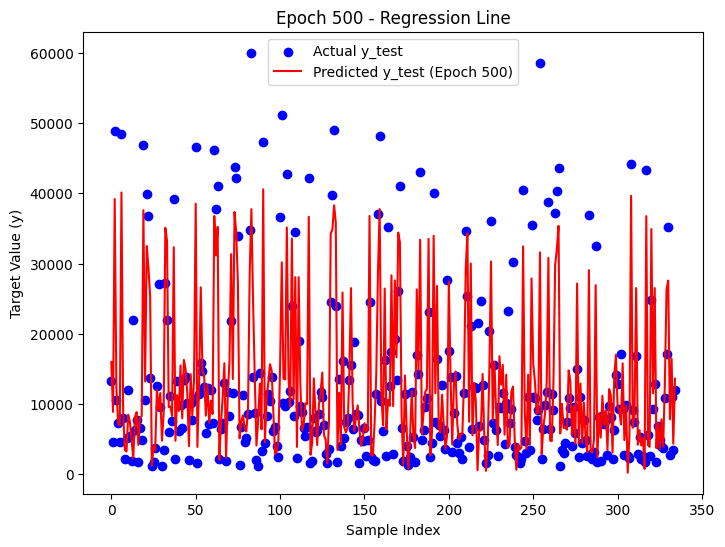

Epoch 50: RMSE = 6795.8810
Epoch 100: RMSE = 6323.6303
Epoch 150: RMSE = 6224.1382
Epoch 200: RMSE = 6180.5871
Epoch 250: RMSE = 6156.1560
Epoch 300: RMSE = 6141.2085
Epoch 350: RMSE = 6131.7008
Epoch 400: RMSE = 6125.5328
Epoch 450: RMSE = 6121.4952
Epoch 500: RMSE = 6118.8513


In [153]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error


# Initialize weights and bias
num_features = X_train.shape[1]
weights = np.random.randn(num_features)  # One weight per feature
bias = np.random.randn()

# Hyperparameters
learning_rate = 0.1
epochs = 500

# Store RMSE values for each 20 epochs
rmse_values = []

# Training loop
for epoch in range(epochs):
    # Predictions for training data
    y_pred_train = np.dot(X_train, weights) + bias

    # Compute gradients
    error = y_pred_train - y_train
    grad_w = (2 / len(X_train)) * np.dot(X_train.T, error)
    grad_b = (2 / len(X_train)) * np.sum(error)

    # Update weights and bias
    weights -= learning_rate * grad_w
    bias -= learning_rate * grad_b

    # RMSE calculation for test data
    if (epoch + 1) % 50 == 0:
        y_pred_test = np.dot(X_test, weights) + bias
        rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
        rmse_values.append((epoch + 1, rmse))

        # Plot the regression line
        plt.figure(figsize=(8, 6))
        plt.scatter(range(len(y_test)), y_test, color="blue", label="Actual y_test")
        plt.plot(range(len(y_pred_test)), y_pred_test, color="red", label=f"Predicted y_test (Epoch {epoch + 1})")
        plt.title(f"Epoch {epoch + 1} - Regression Line")
        plt.xlabel("Sample Index")
        plt.ylabel("Target Value (y)")
        plt.legend()
        plt.show()

# Print RMSE values for every 20 epochs
for epoch, rmse in rmse_values:
    print(f"Epoch {epoch}: RMSE = {rmse:.4f}")


## plot the regression line for feature 2

In [ ]:
# Assuming your data is in DataFrame format, convert it to numpy arrays
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values.ravel()  # Flatten target column
y_test = y_test.values.ravel()

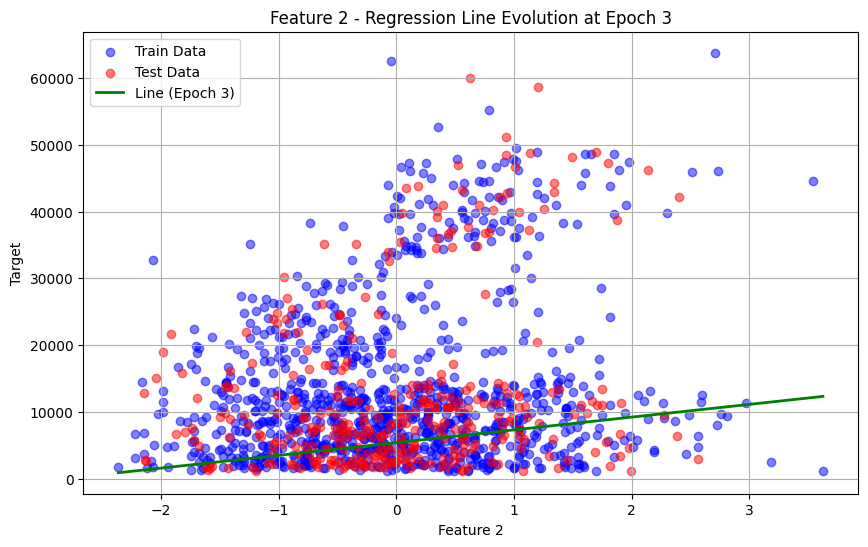

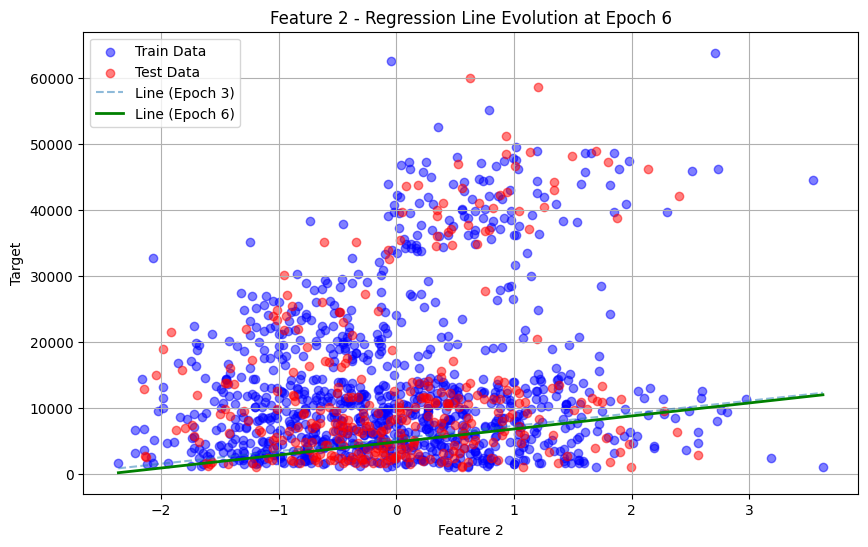

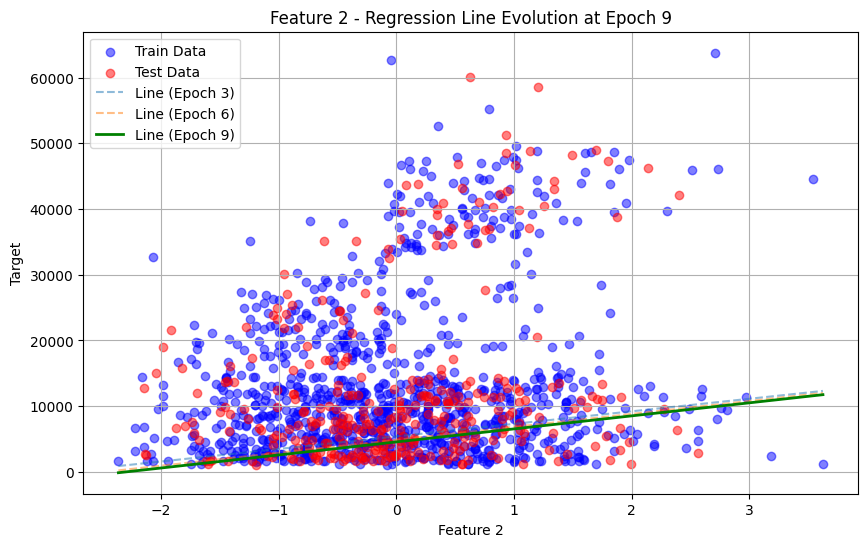

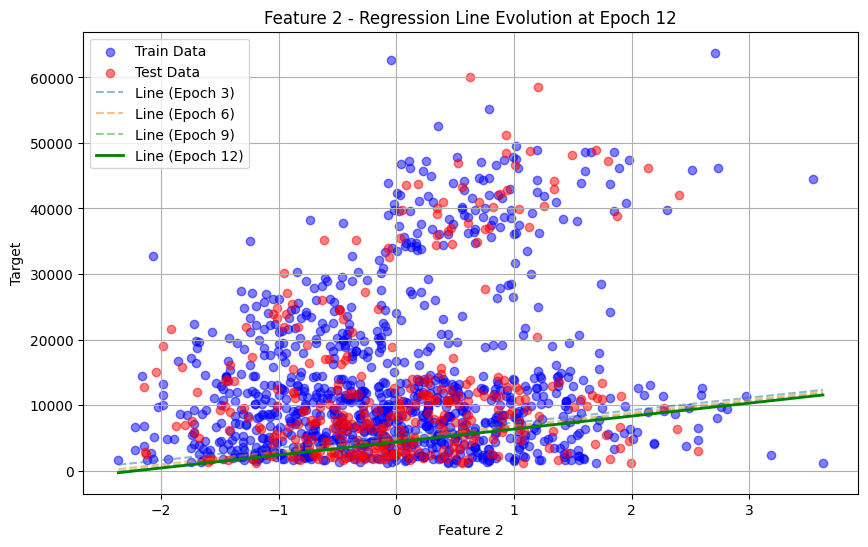

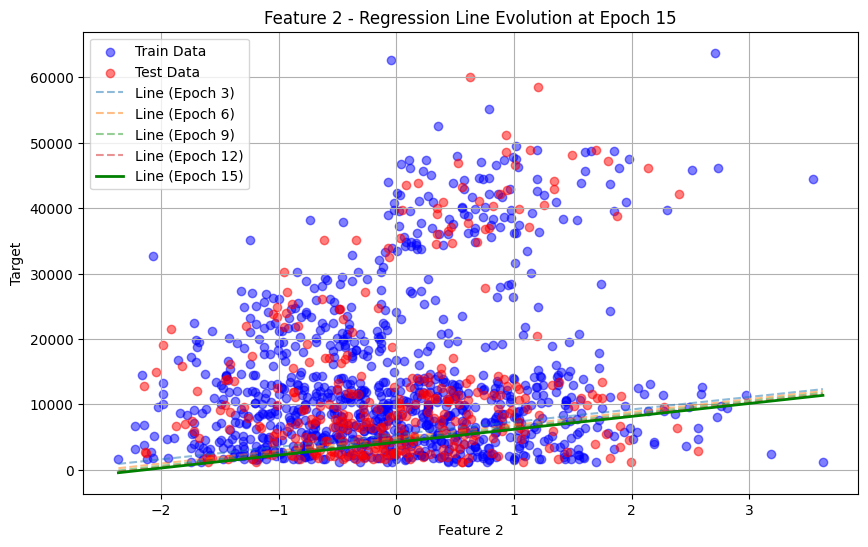

...

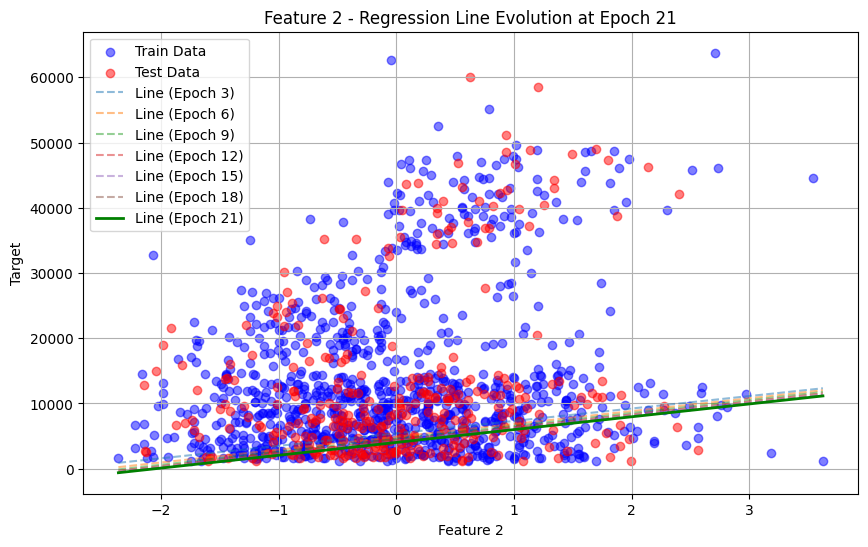

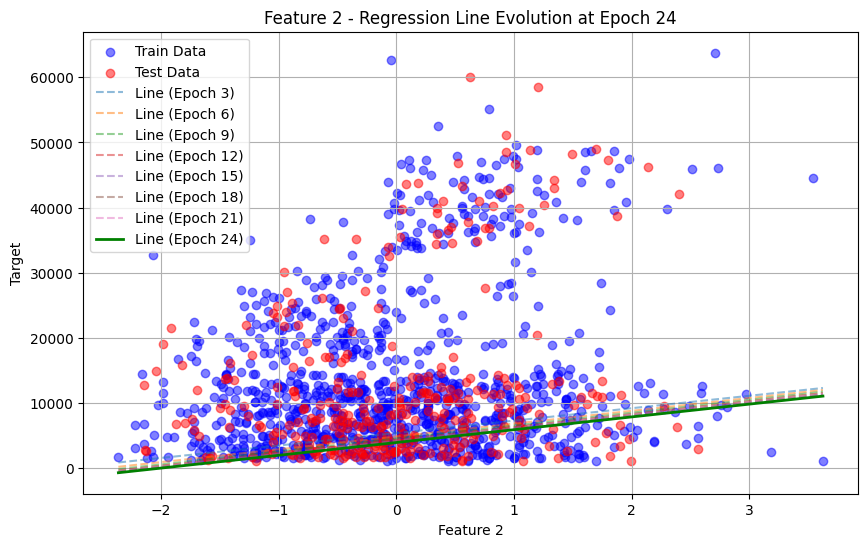

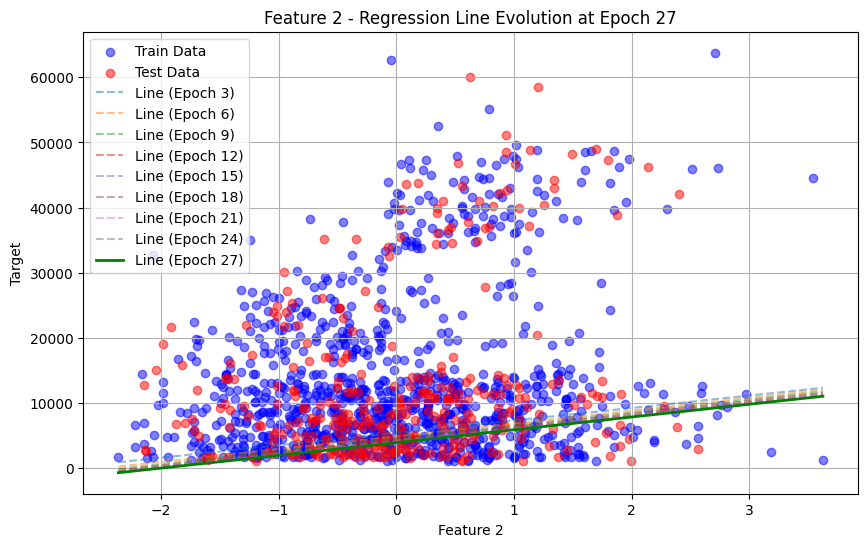

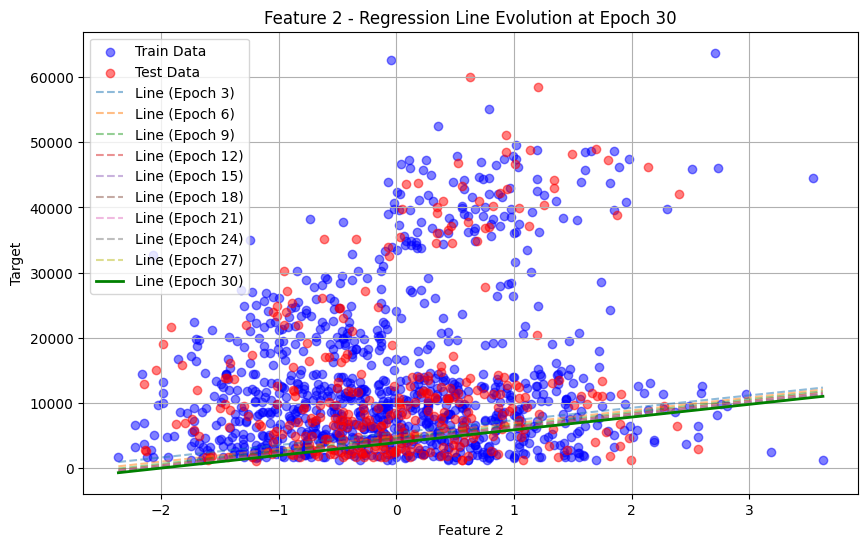

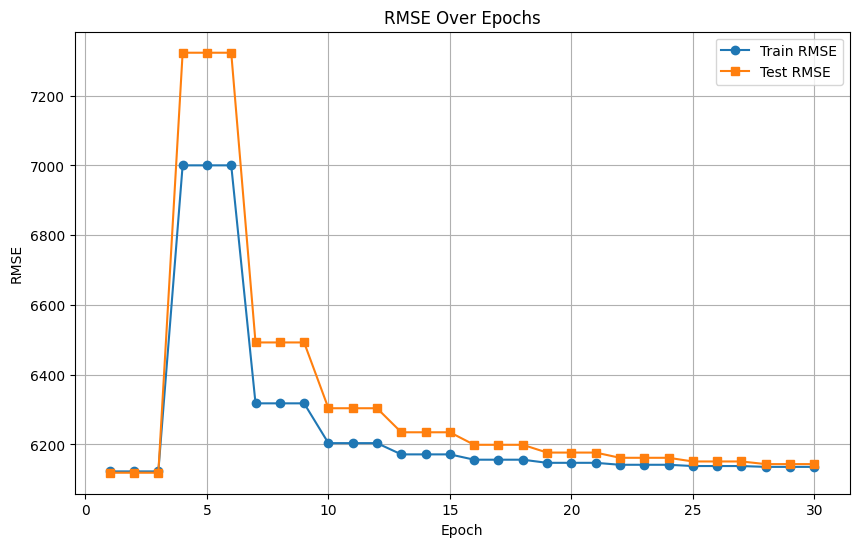

In [154]:
from sklearn.metrics import root_mean_squared_error

# Assuming feature index 1 corresponds to Feature 2 (indexing starts from 0)
feature_idx = 1  # Index of Feature 2
epochs=30
interval=3
sgd = SGDRegressor(max_iter=1, tol=None, warm_start=True, random_state=42)
train_rmse = []
test_rmse = []
lines = []
for epoch in range(1, epochs + 1):
    sgd.fit(X_train, y_train)  # Incremental training
    train_rmse_epoch = root_mean_squared_error(y_train, y_pred_train)
    test_rmse_epoch = root_mean_squared_error(y_test, y_pred_test)
    train_rmse.append(train_rmse_epoch)
    test_rmse.append(test_rmse_epoch)
    if epoch % interval == 0:
        # Predict on train and test data
        y_pred_train = sgd.predict(X_train)
        y_pred_test = sgd.predict(X_test)

        # Calculate RMSE for train and test sets

        # Store RMSE values and regression line coefficients

        lines.append((sgd.intercept_[0], sgd.coef_.copy()))

        # Plotting regression line for Feature 2
        plt.figure(figsize=(10, 6))
        x_vals_train = X_train[:, feature_idx]
        x_vals_test = X_test[:, feature_idx]
        x_range = np.linspace(
            min(x_vals_train.min(), x_vals_test.min()),
            max(x_vals_train.max(), x_vals_test.max()),
            100,
        )
        plt.scatter(x_vals_train, y_train, color='blue', label='Train Data', alpha=0.5)
        plt.scatter(x_vals_test, y_test, color='red', label='Test Data', alpha=0.5)

        # Plot previous regression lines as dotted
        for j, (intercept, coef) in enumerate(lines[:-1]):
            y_line_prev = intercept + coef[feature_idx] * x_range
            plt.plot(x_range, y_line_prev, linestyle='--', alpha=0.5, label=f'Line (Epoch {interval * (j + 1)})')

        # Plot the current regression line as solid
        intercept, coef = lines[-1]
        y_line = intercept + coef[feature_idx] * x_range
        plt.plot(x_range, y_line, color='green', label=f'Line (Epoch {epoch})', linewidth=2)

        # Titles and labels
        plt.title(f"Feature 2 - Regression Line Evolution at Epoch {epoch}")
        plt.xlabel("Feature 2")
        plt.ylabel("Target")
        plt.legend()
        plt.grid()
        plt.show()

# Plot RMSE vs. Epochs
epochs_list = list(range(1, epochs + 1))
plt.figure(figsize=(10, 6))
plt.plot(epochs_list, train_rmse, label='Train RMSE', marker='o')
plt.plot(epochs_list, test_rmse, label='Test RMSE', marker='s')
plt.title("RMSE Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.legend()
plt.grid()
plt.show()


1. Initial Epochs (1–5):

Training RMSE:
Gradually increases but remains relatively stable.

Testing RMSE:
Stays close to the training RMSE initially but spikes sharply around epoch 5.

Comparison:
The test RMSE rises significantly faster than the training RMSE, indicating that the model is overfitting the training data during this phase.

2. Middle Epochs (5–10):

Training RMSE:
Decreases steadily as the model learns.

Testing RMSE:
Drops sharply after its initial spike, narrowing the gap between the two lines.

Comparison:
The test RMSE decreases more drastically compared to the smoother decrease in training RMSE, showing a recovery in generalization ability after early overfitting.

3. Later Epochs (10–30):

Training RMSE:
Gradually decreases further, stabilizing around 6,200.

Testing RMSE:
Stabilizes at a slightly higher level than training RMSE.

Comparison:
Both lines stabilize, but the test RMSE remains consistently higher than the training RMSE, reflecting residual generalization error.

Key Observations About the Lines:

The testing RMSE fluctuates more than the training RMSE, especially in the early epochs (sharp spike and drop).
The training RMSE shows smoother and steadier progress, reflecting consistent model optimization on the training data.

The gap between the two lines (generalization error):

Widens during early overfitting (epochs 1–5).
Narrows as the model improves generalization (epochs 5–10).
Stabilizes at a constant gap in later epochs (epochs 10–30).

In summary, while the training RMSE decreases consistently, the testing RMSE fluctuates early and then follows a similar decreasing trend, stabilizing at a higher level. This indicates that the model learns the training data well but retains some generalization error on unseen data.

# part 4

[462.58573     21.24232315 -11.91293417  -2.82713207   6.43150489
  12.74423628  16.87882911  19.5806445   21.33637731  22.46083663
  23.16319578  23.58488072  23.82209704  23.94021061  23.98337754
  23.98114964  23.95304982  23.91174995  23.86527593  23.81853324]
[3050.78607791 2929.45589347 2892.34270926 2876.45369639 2867.75286232
 2862.3212104  2858.74512032 2856.35594068 2854.76635    2853.7258983
 2853.0643843  2852.66372172 2852.44133006 2852.33934173 2852.31725348
 2852.34681192 2852.40841628 2852.48857543 2852.57810566 2852.6708522 ]
[19273.56858544 22927.63263519 23681.16653917 23841.526741
 23878.57275472 23889.4120276  23894.29681989 23897.50141346
 23899.9759083  23901.98062485 23903.62833674 23904.99293331
 23906.13096191 23907.08686685 23907.89550291 23908.58413001
 23909.17410274 23909.6822422  23910.12190673 23910.50380762]
[2008.71447702 1876.00484615 1756.04658971 1679.99361554 1629.90465326
 1595.91545255 1572.74619905 1557.0855158  1546.66291792 1539.87762781
 1535

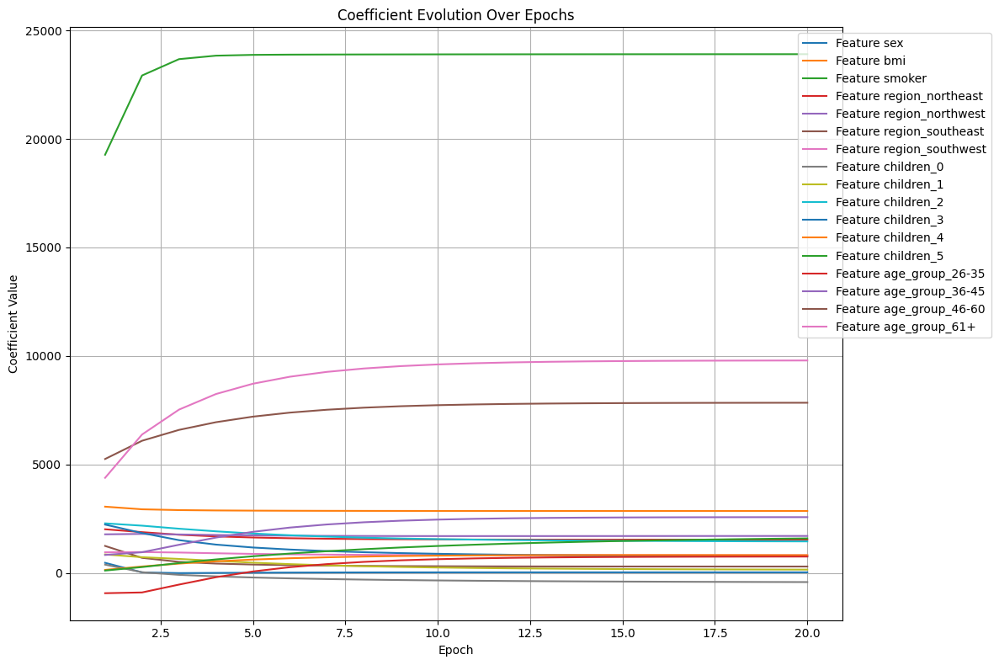

In [157]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import SGDRegressor
import warnings
from sklearn.exceptions import ConvergenceWarning

# Suppress convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)


# Ensure y_train is a 1D array
y_train = y_train.values.ravel() if y_train.ndim > 1 else y_train

# Select 17 features (modify indices if necessary)
selected_features = X_train.columns[:]  # Adjust as needed
X_train_subset = X_train[selected_features]

# Initialize SGDRegressor (stochastic gradient descent for linear regression)
model = SGDRegressor(max_iter=1, warm_start=True, penalty=None, learning_rate='constant', eta0=0.01, random_state=0)

# Track coefficients over 100 epochs
num_epochs = 20
coefficients_history = []

for epoch in range(num_epochs):
    model.fit(X_train_subset, y_train)
    coefficients_history.append(model.coef_.copy())

# Convert to a NumPy array for easier plotting
coefficients_history = np.array(coefficients_history)

# Plot coefficients for each feature over epochs
plt.figure(figsize=(12, 8))
for i in range(len(selected_features)):
    print(coefficients_history[:,i])
    plt.plot(range(1, num_epochs + 1), coefficients_history[:, i], label=f'Feature {selected_features[i]}')

plt.title('Coefficient Evolution Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Coefficient Value')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.tight_layout()
plt.show()



<div style="text-align: right;", dir="rtl">
۱. فرآیند بهینه‌سازی

گرادیان کاهشی تصادفی (SGD) ضرایب را به‌صورت تکراری با محاسبه گرادیان تابع هزینه (مثل خطای میانگین مربعات) نسبت به هر ضریب به‌روزرسانی می‌کند.
در هر مرحله، ضرایب کمی در جهت کاهش تابع هزینه تنظیم می‌شوند.
با گذشت زمان، به‌روزرسانی‌ها کوچکتر می‌شوند، زیرا:
مدل به حداقل تابع هزینه نزدیک‌تر می‌شود.
مقدار گرادیان با نزدیک شدن به حداقل کاهش می‌یابد.

۲. نرخ یادگیری

نرخ یادگیری (eta0) اندازه گام‌های هر به‌روزرسانی را تعیین می‌کند.
اگر نرخ یادگیری مناسب باشد، مدل سریعاً به حداقل نزدیک می‌شود بدون اینکه بیش از حد پیشروی کند.
زمانی که مقدار هزینه تثبیت می‌شود (یعنی به‌روزرسانی‌های بیشتر بهبود ناچیزی ایجاد می‌کنند)، ضرایب نیز تثبیت می‌شوند.

۳. همگرایی

زمانی که گرادیان تقریباً به صفر نزدیک شود، ضرایب تغییر قابل توجهی نمی‌کنند، که نشان‌دهنده همگرایی به یک راه‌حل پایدار است.
در این نقطه، مدل اساساً «یاد گرفته» است که وزن‌های بهینه برای داده‌های آموزشی داده شده را پیدا کند.

۴. چرا ضرایب پس از چند دوره تثبیت می‌شوند؟

مقداردهی اولیه: ضرایب با مقادیر تصادفی یا صفر شروع می‌شوند و در به‌روزرسانی‌های اولیه تغییرات قابل توجهی رخ می‌دهد، زیرا مدل خود را با داده‌ها تطبیق می‌دهد.
کاهش گرادیان‌ها: با نزدیک شدن مدل به راه‌حل بهینه، گرادیان کوچک‌تر می‌شود و به‌روزرسانی‌ها نیز کوچکتر می‌شوند.
پوشش داده‌ها: پس از چند دوره، مدل کل داده‌ها را چندین بار دیده است (در مورد SGD)، بنابراین به‌روزرسانی‌های بیشتر اصلاحات جزئی ایجاد می‌کنند، نه تغییرات بزرگ.

۵. عوامل مؤثر بر تثبیت

نرخ یادگیری:

نرخ یادگیری زیاد ممکن است باعث نوسانات شود یا از همگرایی جلوگیری کند.
نرخ یادگیری کم فرآیند را کند می‌کند اما همگرایی روان‌تری ایجاد می‌کند.

ویژگی‌های داده:

داده‌های پر از نویز یا داده‌های پرت ممکن است به دوره‌های بیشتری برای تثبیت ضرایب نیاز داشته باشند.

منظم‌سازی (Regularization):

اضافه کردن عبارات منظم‌سازی (مثل جریمه‌های L1 یا L2) می‌تواند روی نحوه تثبیت ضرایب تأثیر بگذارد.

تعداد ویژگی‌ها:

با افزایش تعداد ویژگی‌ها، ممکن است زمان بیشتری طول بکشد تا تمام ضرایب تثبیت شوند، زیرا مدل باید سهم آن‌ها را متعادل کند.
</div>